In [1]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import json

In [2]:
user = "green"
source = f'data/{user}/{user}_chunks/'
save_path = f'data/{user}/'

In [3]:
with open(f'{source}{user}_test_acc10.json', 'r') as f:
        data_all = json.load(f)

In [4]:
# run if the first file
data_all = data_all['rawAccelerometer'][0]
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'rawAccelerometer'

In [5]:
# run if cont
values = data_all["cont"]

t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

KeyError: 'cont'

In [6]:
# Run if a new user but not the first acc
watch_pos = data_all['firstName']
print(watch_pos)
values = data_all['values']
t = [i['t'] for i in values]
offset = [i['offset'] for i in values]

green_LHand


In [7]:
acc_x = [part['x'] for i in values for part in i['samples']]
acc_y = [part['y'] for i in values for part in i['samples']]
acc_z = [part['z'] for i in values for part in i['samples']]


In [10]:
butterfly_25_shortened = np.load('butterfly_25_shortened.npy')

In [20]:
full_lap_butterfly_x = butterfly_25_shortened[0]
full_lap_butterfly_y = butterfly_25_shortened[1]
full_lap_butterfly_z = butterfly_25_shortened[2]

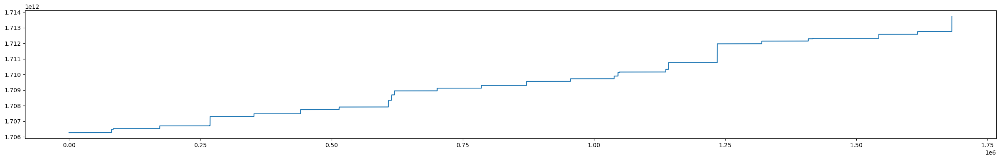

In [11]:
second = t[1] - t[0]
freq = 25.0
period = second / freq
t_all = []
for sec in t:
    subsec = np.arange(sec, sec + second, period)
    for s in subsec:
        t_all.append(s)
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all)

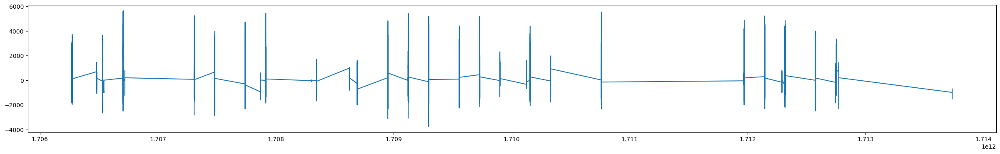

In [12]:
fig = plt.figure(figsize=(30, 4))
plt.plot(t_all, acc_x)

In [13]:
from datetime import datetime, timedelta, date
import time
timestamp = time.time()
date_object = datetime.fromtimestamp(timestamp)
print("Datetime:", date_object.date())

Datetime: 2025-01-27


In [14]:
# make a list of datetime objects showing all days data collection happened: swimming_days
current_day = date(2024, 1, 29)
swimming_days = []
finish_day = date(2024, 4, 10)
while current_day < finish_day:
    swimming_days.append(current_day)
    if current_day.weekday() == 0 or current_day.weekday() == 2:
        current_day += timedelta(days=2)
    elif current_day.weekday() == 4:
        current_day += timedelta(days=3)
    else:
        print(f'error, date {current_day} and weekday:{current_day.weekday()}')
print(f'we have {len(swimming_days)} days of swimming data')

we have 31 days of swimming data


In [15]:
# Finding the indices of the swimming dates
data_dates_set = set()
# indices are index of start of a swimming day that we have data for
indices = []
not_swimmed_i = []
# we might have data on days swimming not happened
# i might've turned the watch on for some reason
# all dates i : all the indices on the begining of the day
# the watch collected any form of data
all_dates_i = []
swimming_dates_date = []
i = 0
for t in t_all:
    # for each t in times that swimming happened, find the date
    date_object = datetime.fromtimestamp(t/1000.0)
    # as long as there's a date to add
    tmplen = len(data_dates_set)
    data_dates_set.add(date_object.date())

    if len(data_dates_set) > tmplen:
        if date_object.date() in swimming_days:
            indices.append(i)
        else:
            not_swimmed_i.append(i)
        all_dates_i.append(i)
    i += 1
print(f'we have at most {len(indices)} days of swimming in this batch')



we have at most 21 days of swimming in this batch


/tmp/ipykernel_17063/2928146161.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 6))


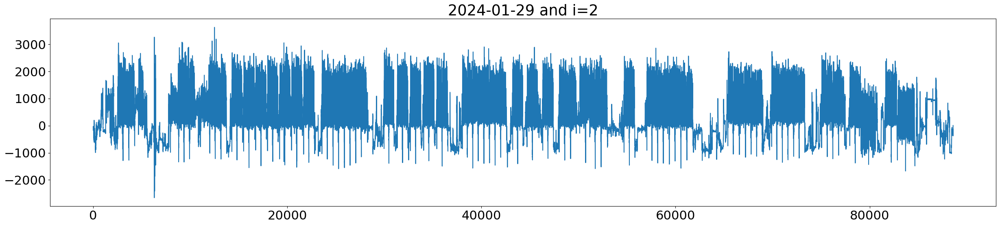

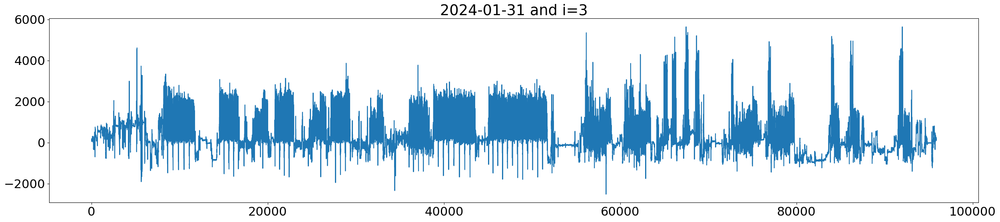

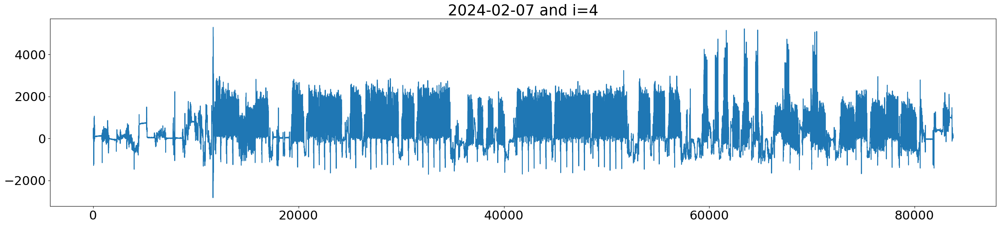

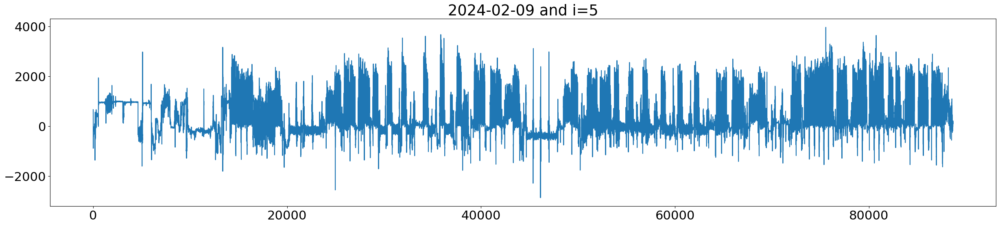

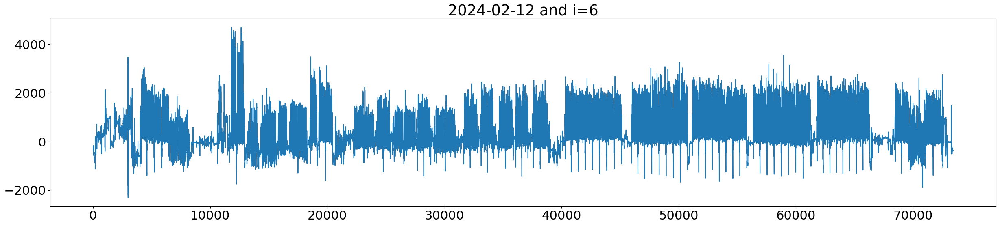

...

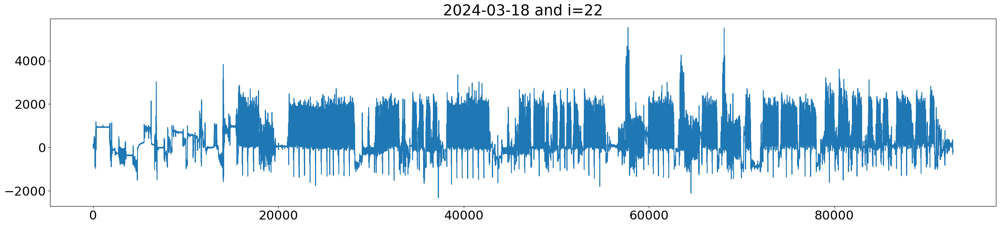

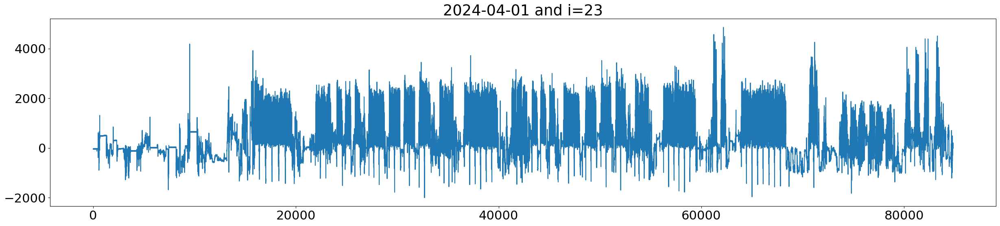

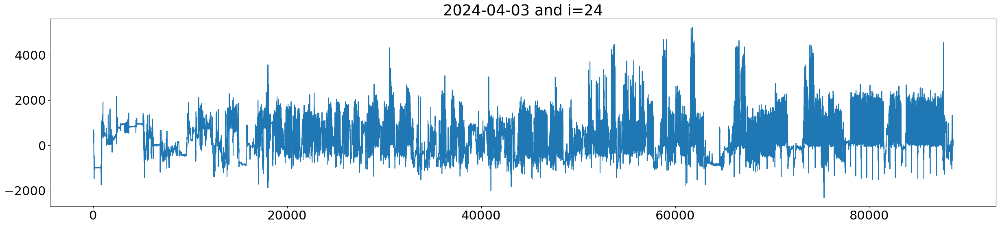

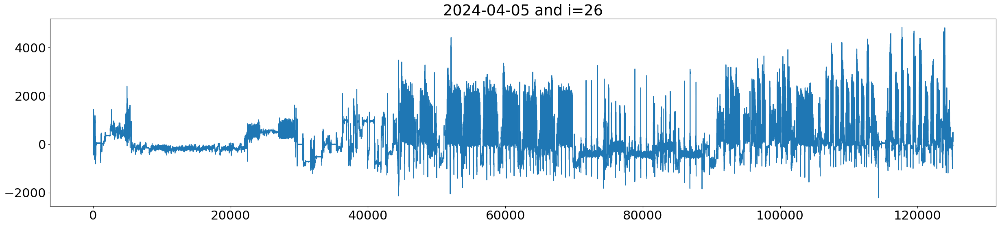

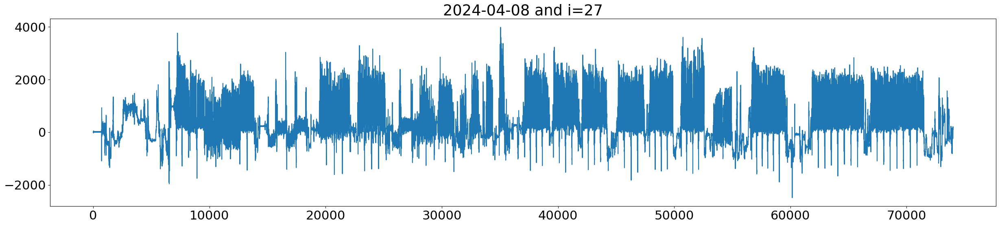

In [28]:
# plotting all dates of available data in this batch of data
for i in range(len(all_dates_i)):
    if i < (len(all_dates_i) - 1):
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:all_dates_i[i+1]])
            plt.title(f'{date_object.date()} and i={i}')
    else:
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:])
            plt.title(f'{date_object.date()} and i={i}')
        
        

date is 2024-01-29 and index is 84150, i=2
date is 2024-01-31 and index is 172750, i=3
date is 2024-02-07 and index is 268625, i=4
date is 2024-02-09 and index is 352375, i=5
date is 2024-02-12 and index is 441050, i=6
date is 2024-02-14 and index is 514950, i=8
date is 2024-02-19 and index is 608850, i=10
date is 2024-02-23 and index is 614825, i=12
date is 2024-02-26 and index is 619825, i=13
date is 2024-02-28 and index is 701450, i=14
date is 2024-03-01 and index is 785725, i=15
date is 2024-03-04 and index is 871650, i=16
date is 2024-03-06 and index is 955500, i=17
date is 2024-03-08 and index is 1038675, i=18
date is 2024-03-11 and index is 1048300, i=20
date is 2024-03-13 and index is 1137000, i=21
date is 2024-03-18 and index is 1142100, i=22
date is 2024-04-01 and index is 1234925, i=23
date is 2024-04-03 and index is 1319750, i=24
date is 2024-04-05 and index is 1417600, i=26
date is 2024-04-08 and index is 1542775, i=27


/tmp/ipykernel_17063/3799513688.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 6))


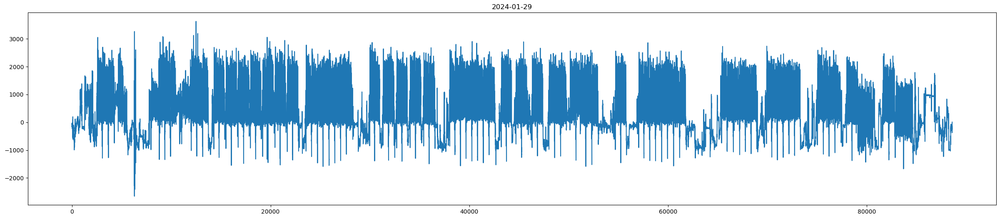

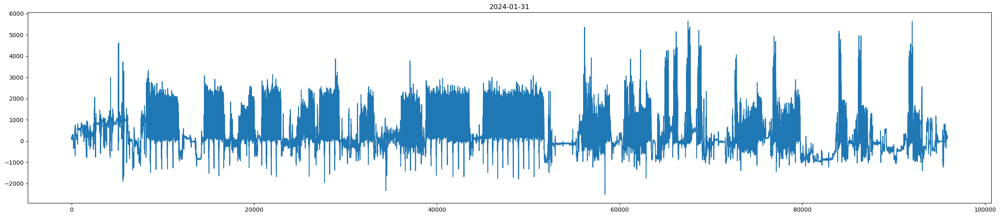

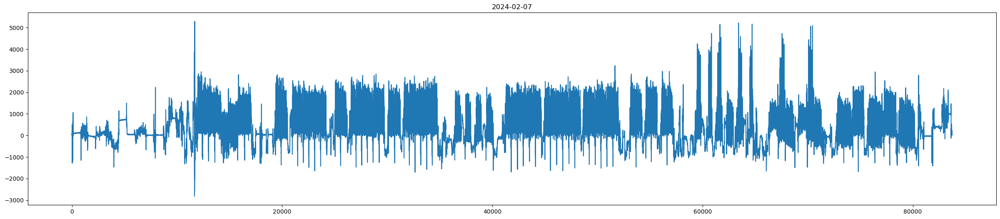

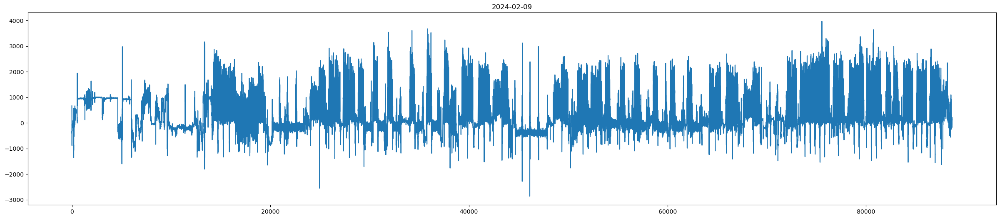

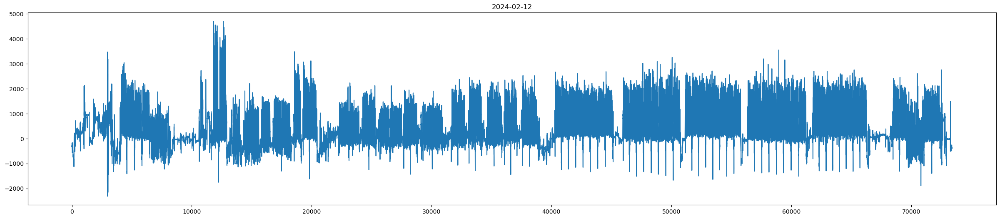

...

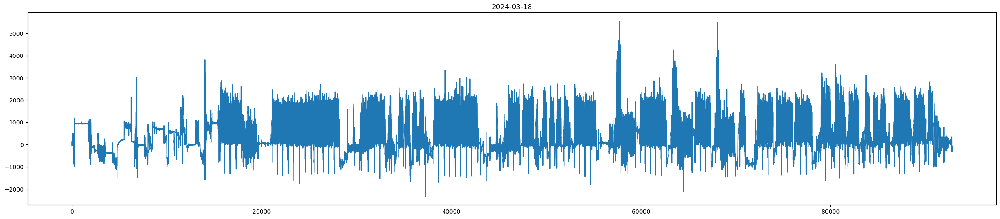

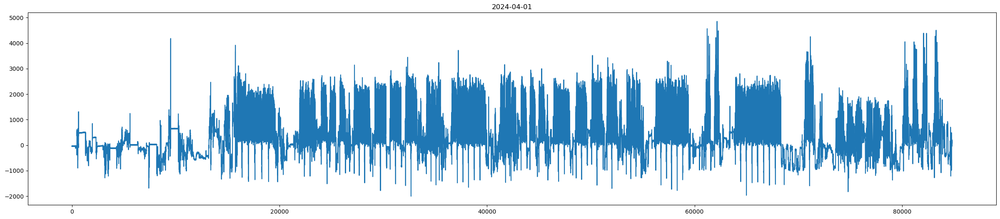

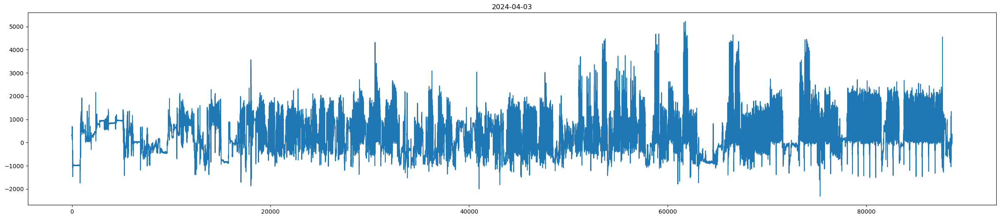

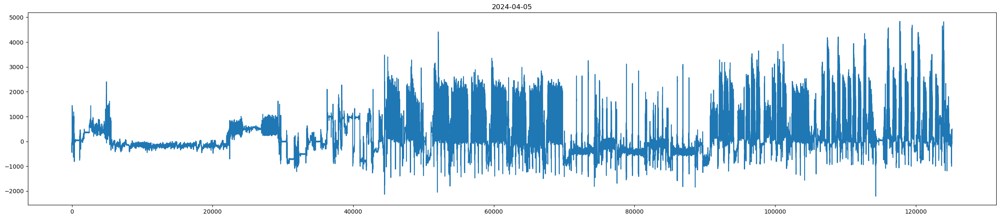

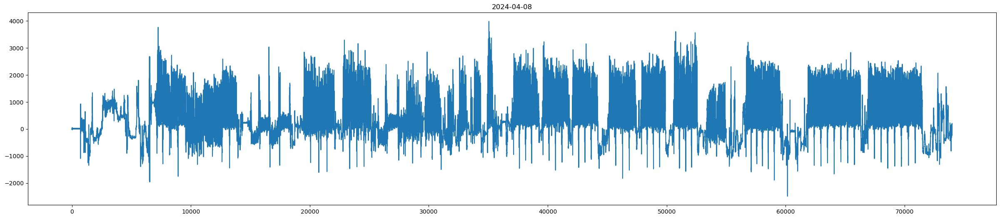

In [17]:
for i in range(len(all_dates_i)):
    if i < (len(all_dates_i) - 1):
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:all_dates_i[i+1]])
            plt.title(f'{date_object.date()}')
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}, i={i}')
    else:
        if all_dates_i[i] in indices:
            date_object = datetime.fromtimestamp(t_all[all_dates_i[i]]/1000.0)
            fig = plt.figure(figsize=(30, 6))
            plt.plot(acc_x[all_dates_i[i]:])
            plt.title(f'{date_object.date()}')
            print(f'date is {date_object.date()} and index is {all_dates_i[i]}')

In [29]:
index = 3

2024-01-31 06:01:20


Text(0, 0.5, 'acceleration in y')

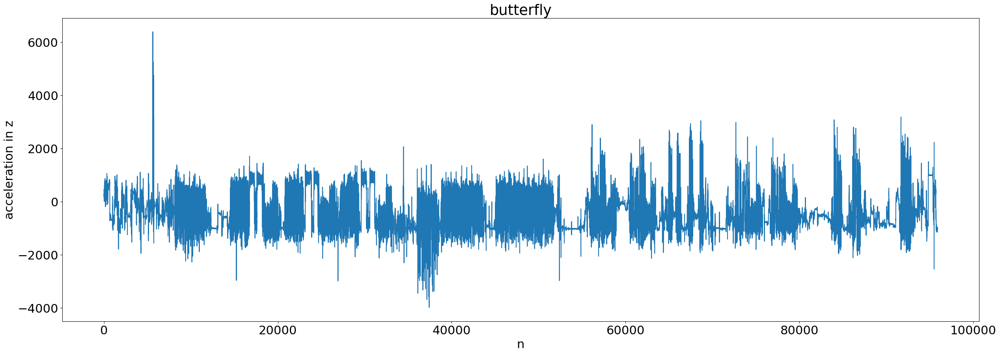

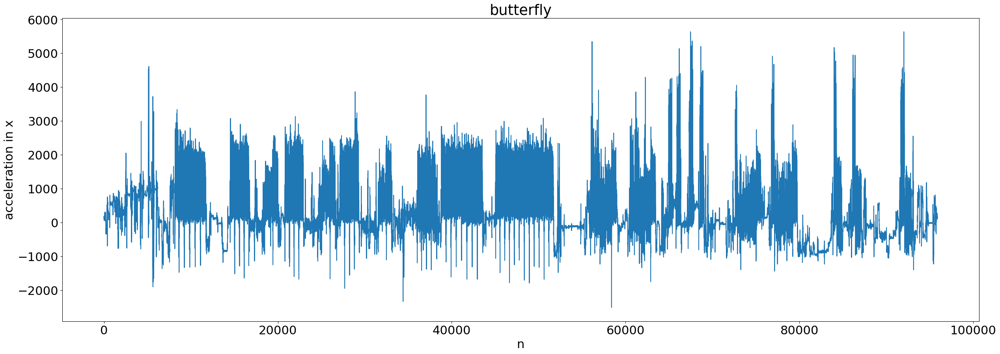

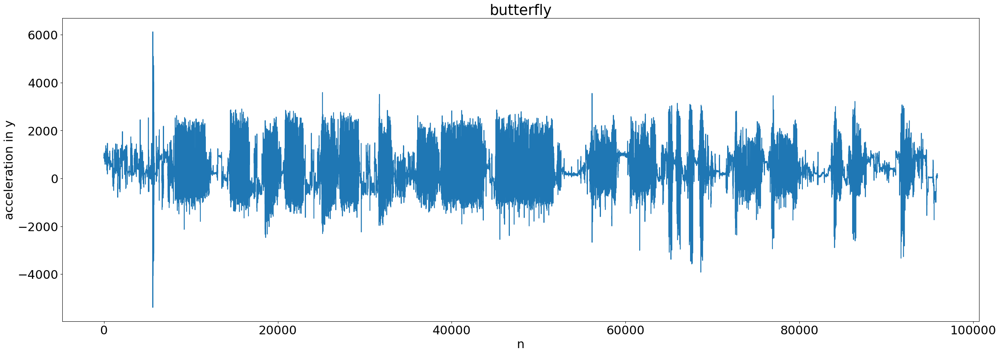

In [30]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
# full_lap_butterfly_x = x[20100:20800]
# full_lap_butterfly_y = y[20100:20800]
# full_lap_butterfly_z = z[20100:20800]
start = 0
end = -(1)
plt.plot(z[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[start:end])
plt.xlabel("n")
plt.ylabel("acceleration in y")

In [34]:
# plt.rcParams.update({'font.size': 22})
# fig = plt.figure(figsize=(30, 10))
# date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
# print(date_object)
z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# # butterfly_x = x[20275:20365]
# # butterfly_z = z[20275:20365]
# # butterfly_y = y[20275:20365]
# start =53500 + 10000
# end = start + 600
# full_lap_butterfly_x = x[start:end]
# full_lap_butterfly_y = y[start:end]
# full_lap_butterfly_z = z[start:end]

# plt.plot(z[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in z")
# fig = plt.figure(figsize=(30, 10))
# plt.plot(x[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in x")
# fig = plt.figure(figsize=(30,10))
# plt.title("butterfly")
# plt.plot(y[start:end])
# plt.xlabel("n")
# plt.ylabel("acceleration in y")

In [32]:
# plt.rcParams.update({'font.size': 22})
# fig = plt.figure(figsize=(30, 10))
# index = 2
# date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
# print(date_object)
# # z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# # y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# # x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# # butterfly_x = x[20275:20365]
# # butterfly_z = z[20275:20365]
# # butterfly_y = y[20275:20365]
# start = 53000 + 12800
# end = start + 800
# full_lap_butterfly_x = x[start:end]
# full_lap_butterfly_y = y[start:end]
# full_lap_butterfly_z = z[start:end]
# # butterly_25 = np.stack((full_lap_butterfly_x, full_lap_butterfly_y, full_lap_butterfly_z), axis = 0)
# # np.save('butterfly_25.npy', butterly_25)
# plt.plot(z[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in z")
# fig = plt.figure(figsize=(30, 10))
# plt.plot(x[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in x")
# fig = plt.figure(figsize=(30,10))
# plt.title("butterfly")
# plt.plot(y[start:end])
# plt.xlabel("n")
# plt.ylabel("acceleration in y")

In [33]:
# plt.rcParams.update({'font.size': 22})
# fig = plt.figure(figsize=(30, 10))
# index = 2
# date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
# print(date_object)
# # z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# # y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# # x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# # butterfly_x = x[20275:20365]
# # butterfly_z = z[20275:20365]
# # butterfly_y = y[20275:20365]
# start = 53000 + 13000
# end = start + 400
# full_lap_butterfly_x = x[start:end]
# full_lap_butterfly_y = y[start:end]
# full_lap_butterfly_z = z[start:end]
# # butterly_25_shortened = np.stack((full_lap_butterfly_x, full_lap_butterfly_y, full_lap_butterfly_z), axis = 0)
# # np.save('butterfly_25_shortened.npy', butterly_25_shortened)
# plt.plot(z[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in z")
# fig = plt.figure(figsize=(30, 10))
# plt.plot(x[start:end])
# plt.title("butterfly")
# plt.xlabel("n")
# plt.ylabel("acceleration in x")
# fig = plt.figure(figsize=(30,10))
# plt.title("butterfly")
# plt.plot(y[start:end])
# plt.xlabel("n")
# plt.ylabel("acceleration in y")

lagxy: 86100


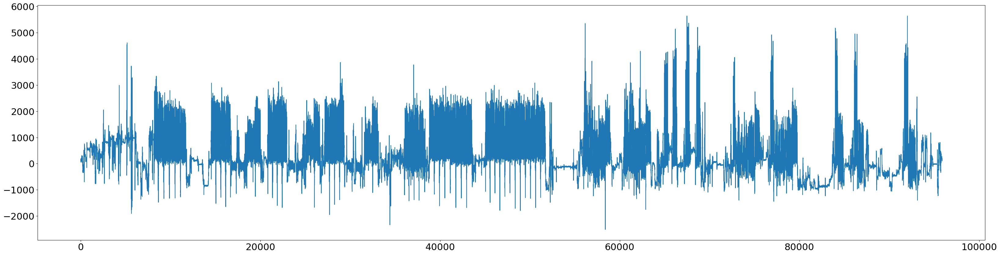

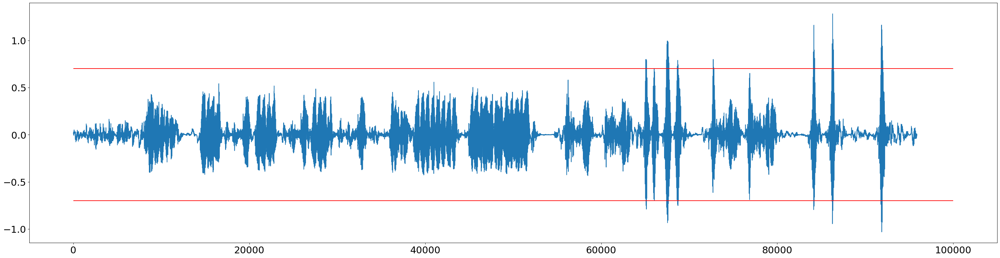

In [41]:
from scipy import signal

corrx = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrx = corrx /(np.std(x)*np.std(full_lap_butterfly_x)*len(full_lap_butterfly_x))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrx)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(x)
fig = plt.figure(figsize=(40, 10))
plt.plot(corrx)
plt.hlines(0.70, 0,100000,color='r')
plt.hlines(-0.70, 0,100000,color='r')

In [76]:

fly_suspect = [i for i in lags[np.where(np.abs(corrx)>0.68)]]
fly_suspect.insert(0, 0)
potential_i_fly = []
for j in range(len(fly_suspect)):
    if fly_suspect[j] - fly_suspect[j-1] > 300:
        potential_i_fly.append(fly_suspect[j])

fly_j 64857, fly_j-1=0
fly_j 65790, fly_j-1=64960
fly_j 67214, fly_j-1=65841
fly_j 68420, fly_j-1=67503
fly_j 72524, fly_j-1=68568
fly_j 76661, fly_j-1=72619
fly_j 83918, fly_j-1=76661
fly_j 86008, fly_j-1=84057
fly_j 91586, fly_j-1=86197


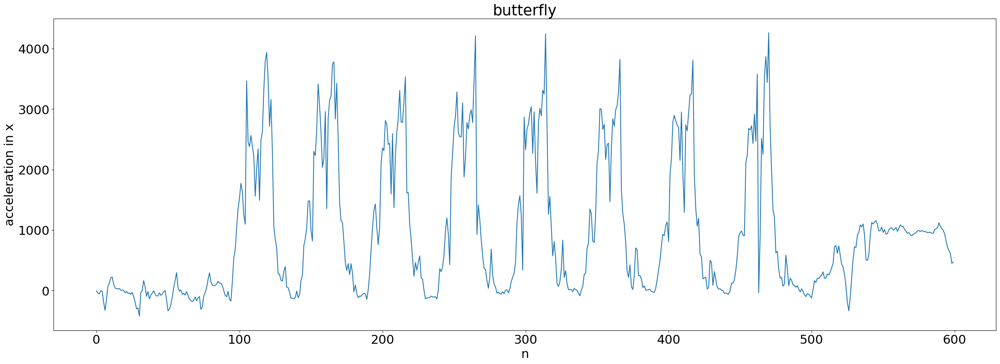

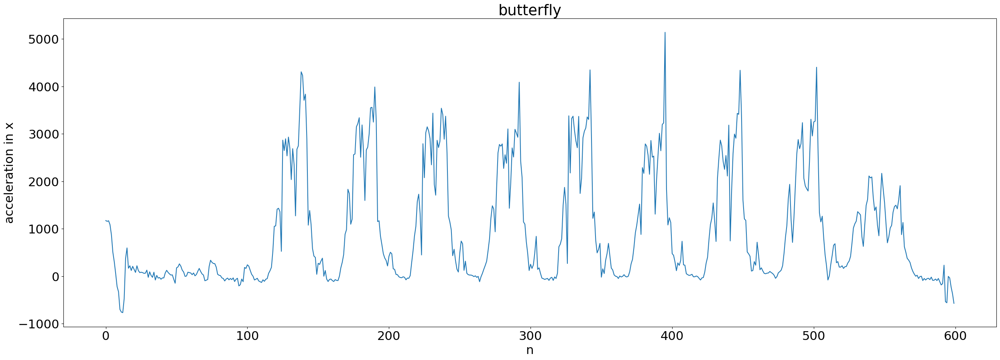

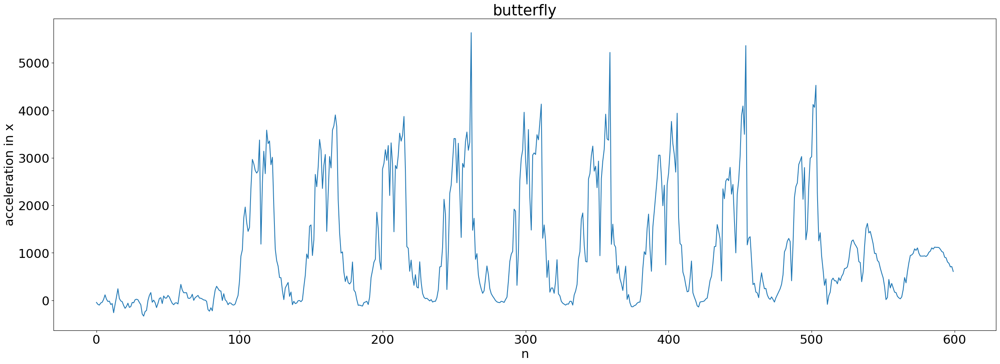

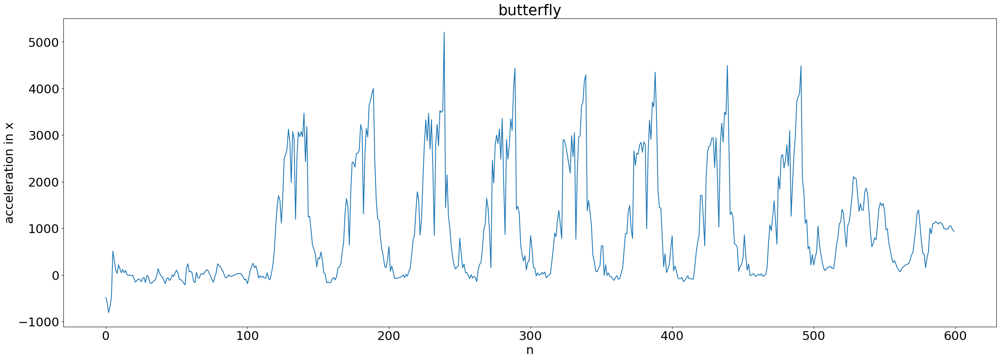

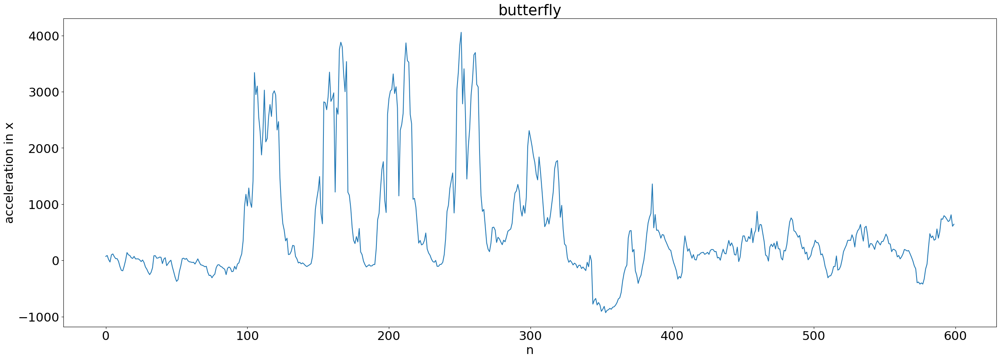

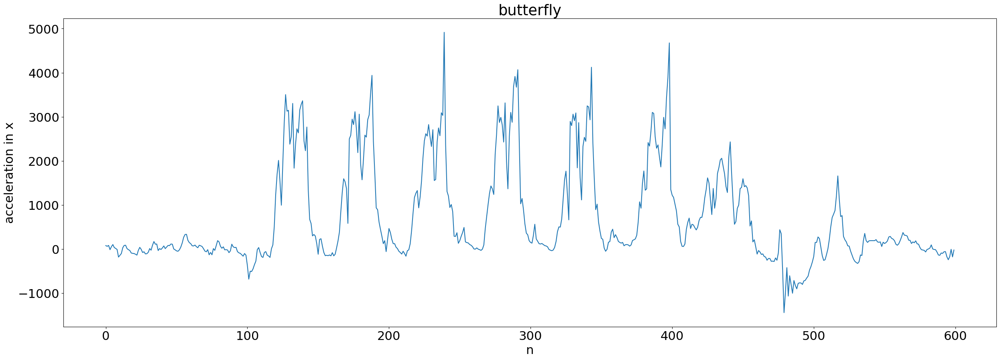

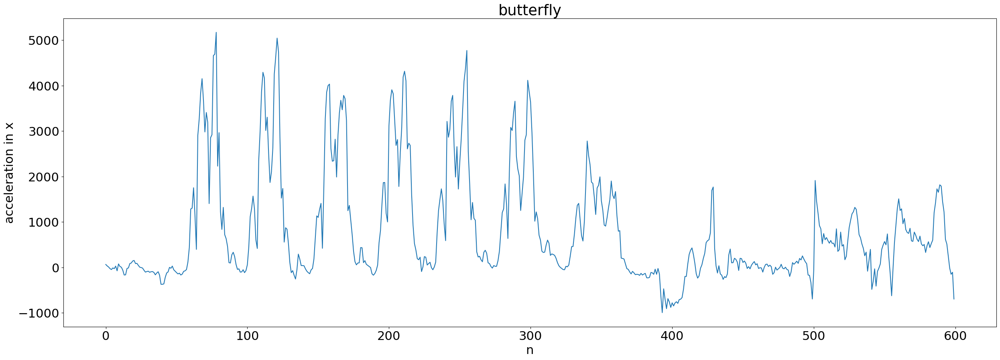

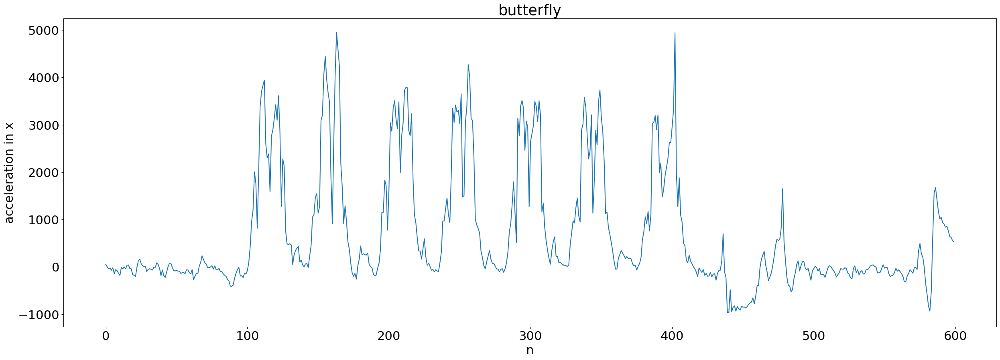

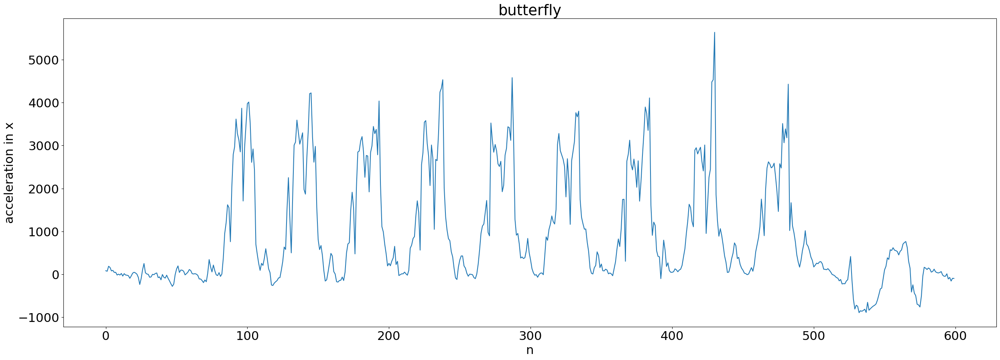

In [86]:
plt.rcParams.update({'font.size': 22})
chosen_length= 600
fly_x = np.zeros((len(potential_i_fly), chosen_length))
fly_y = np.zeros((len(potential_i_fly), chosen_length))
fly_z = np.zeros((len(potential_i_fly), chosen_length))
count = 0
for i_fly in potential_i_fly:
    fig = plt.figure(figsize=(30, 10))
    plt.plot(x[i_fly:(i_fly+600)])
    fly_x[count, :] = x[i_fly:(i_fly+600)]
    fly_y[count, :] = y[i_fly:(i_fly+600)]
    fly_z[count, :] = z[i_fly:(i_fly+600)]
    count += 1
    plt.title("butterfly")
    plt.xlabel("n")
    plt.ylabel("acceleration in x")

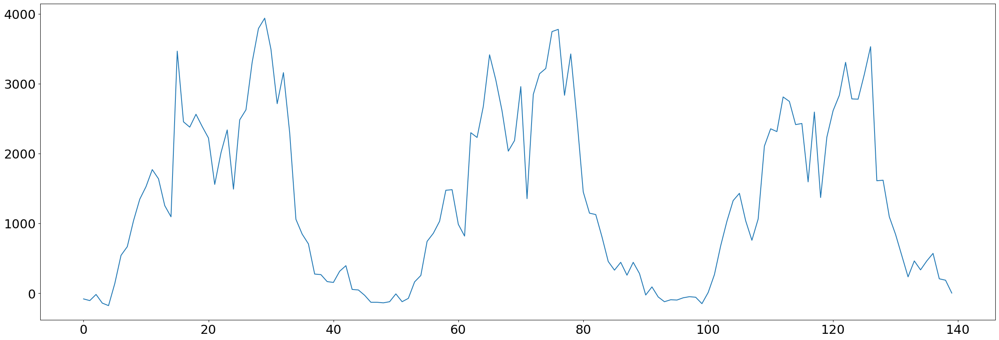

In [91]:
fig = plt.figure(figsize=(30, 10))
plt.plot(fly_x[0][90:230])
stroke_3_flyx = fly_x[0][90:230]


lagxy: 90


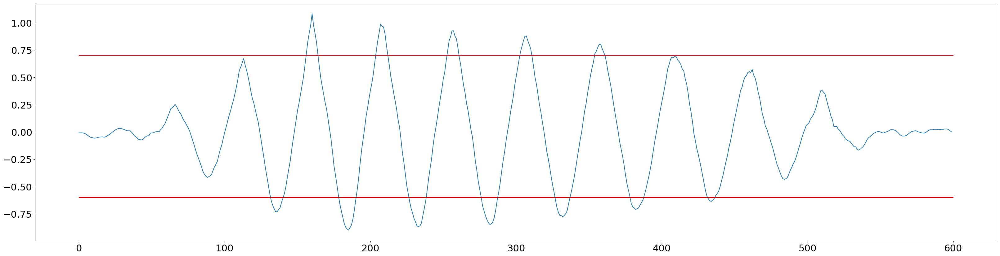

In [111]:
from scipy import signal

corr_stroke = signal.correlate((fly_x[0]-fly_x[0].mean()), (stroke_3_flyx-stroke_3_flyx.mean()), mode="same", method="direct")
corr_stroke = corr_stroke /(np.std(fly_x[0])*np.std(stroke_3_flyx)*len(stroke_3_flyx))
lags = signal.correlation_lags(len(fly_x[0]), len(stroke_3_flyx), mode="same")
lagxy = lags[np.argmax(corr_stroke)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corr_stroke)
plt.hlines(0.70, 0,600,color='r')
plt.hlines(-0.60, 0,600,color='r')

In [112]:

flystroke_suspect = [i for i in lags[np.where(corr_stroke>0.70)]]
flystroke_suspect.insert(0, 0)
print(flystroke_suspect)
potential_i_fly_stroke = []
for j in range(len(flystroke_suspect)):
    if flystroke_suspect[j] - flystroke_suspect[j-1] > 32:
        potential_i_fly_stroke.append(flystroke_suspect[j])
potential_i_fly_stroke

[0, 86, 87, 88, 89, 90, 91, 92, 93, 94, 134, 135, 136, 137, 138, 139, 140, 141, 142, 183, 184, 185, 186, 187, 188, 189, 190, 233, 234, 235, 236, 237, 238, 239, 240, 284, 285, 286, 287, 288, 289, 290, 291, 339]


[86, 134, 183, 233, 284, 339]

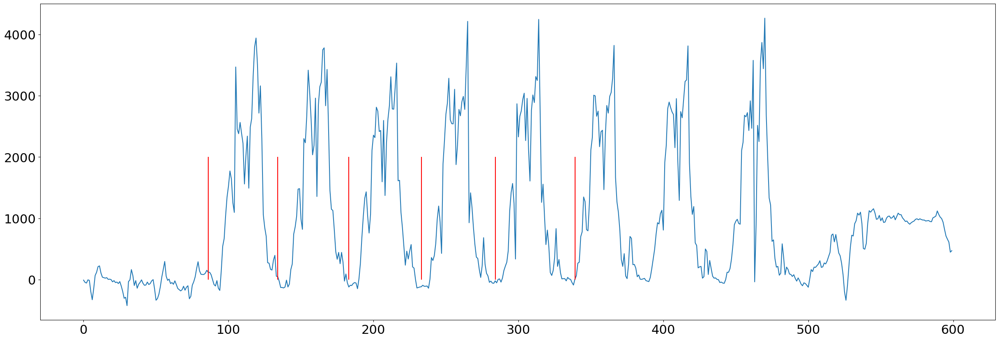

In [113]:
fig = plt.figure(figsize=(30, 10))
plt.plot(fly_x[0])
plt.vlines(potential_i_fly_stroke,-0, 2000,color='r')

2024-01-29 06:05:49


Text(0, 0.5, 'acceleration in y')

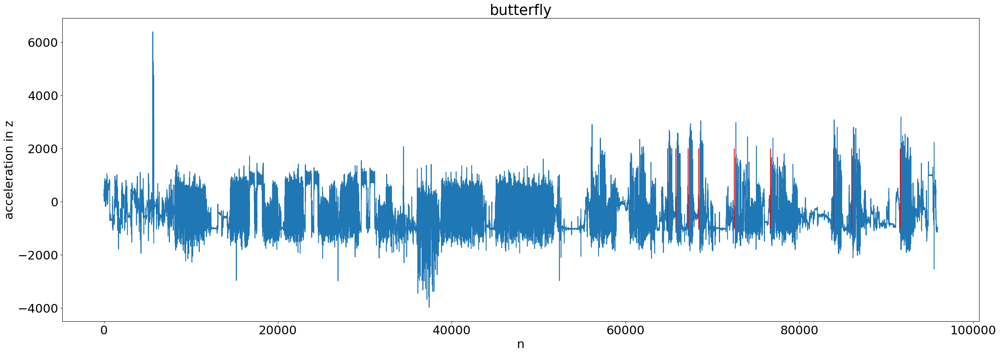

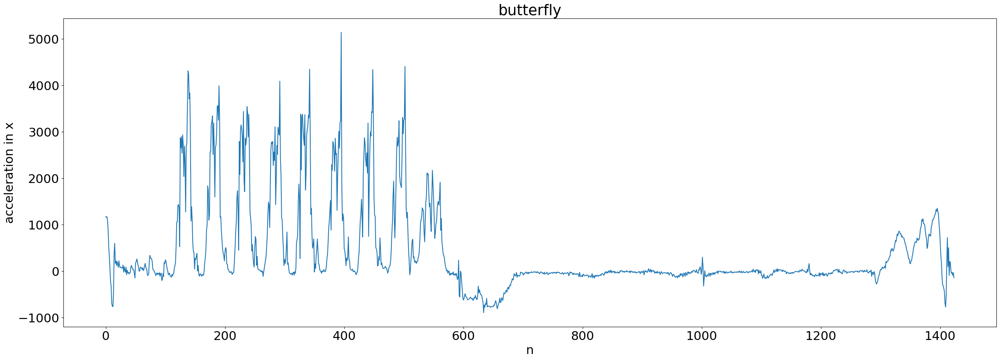

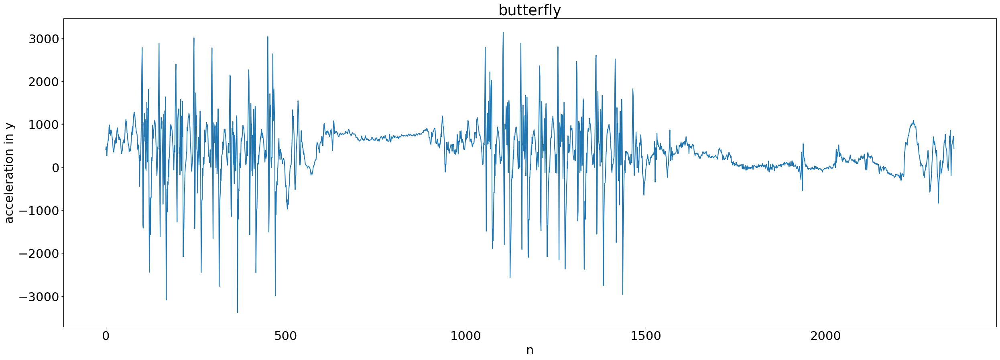

In [82]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
# z = np.array(acc_z[all_dates_i[index]:all_dates_i[index+1]])
# y = np.array(acc_y[all_dates_i[index]:all_dates_i[index+1]])
# x = np.array(acc_x[all_dates_i[index]:all_dates_i[index+1]])
# butterfly_x = x[20275:20365]
# butterfly_z = z[20275:20365]
# butterfly_y = y[20275:20365]
# start = potential_i_fly[i]
# end = start + 400
# full_lap_butterfly_x = x[start:end]
# full_lap_butterfly_y = y[start:end]
# full_lap_butterfly_z = z[start:end]
# butterly_25_shortened = np.stack((full_lap_butterfly_x, full_lap_butterfly_y, full_lap_butterfly_z), axis = 0)
# np.save('butterfly_25_shortened.npy', butterly_25_shortened)
plt.plot(z[start:end])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
plt.vlines(potential_i_fly,-1000, 2000,color='r')

fig = plt.figure(figsize=(30, 10))
plt.plot(x[potential_i_fly[1]:potential_i_fly[2]])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[potential_i_fly[0]:potential_i_fly[2]])
plt.xlabel("n")
plt.ylabel("acceleration in y")

lagxy: 15186


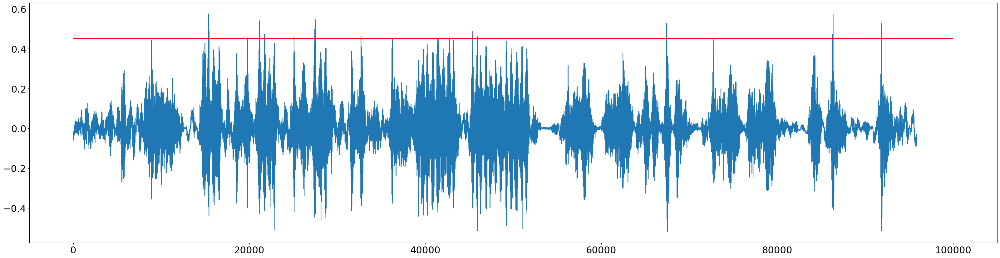

In [42]:
from scipy import signal

corry = signal.correlate((y-y.mean()), (full_lap_butterfly_y-full_lap_butterfly_y.mean()), mode="same", method="direct")
corry = corry /(np.std(y)*np.std(full_lap_butterfly_y)*len(full_lap_butterfly_y))
lags = signal.correlation_lags(len(y), len(full_lap_butterfly_y), mode="same")
lagxy = lags[np.argmax(corry)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corry)
plt.hlines(0.45, 0,100000,color='r')

lagxy: 86102


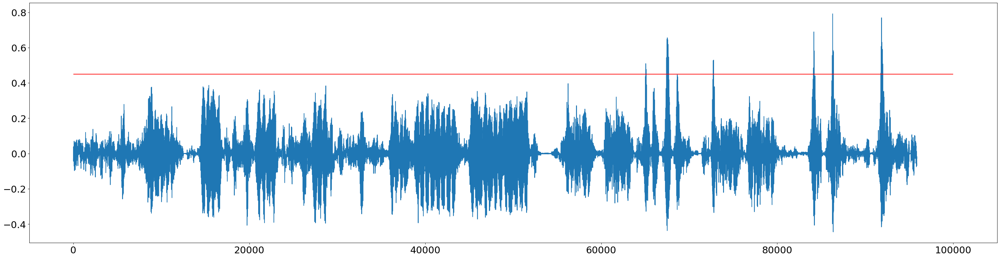

In [43]:
from scipy import signal

corrz = signal.correlate((z-z.mean()), (full_lap_butterfly_z-full_lap_butterfly_z.mean()), mode="same", method="direct")
corrz = corrz /(np.std(z)*np.std(full_lap_butterfly_z)*len(full_lap_butterfly_z))
lags = signal.correlation_lags(len(z), len(full_lap_butterfly_z), mode="same")
lagxy = lags[np.argmax(corrz)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrz)
plt.hlines(0.45, 0,100000,color='r')

lagxy: 72900


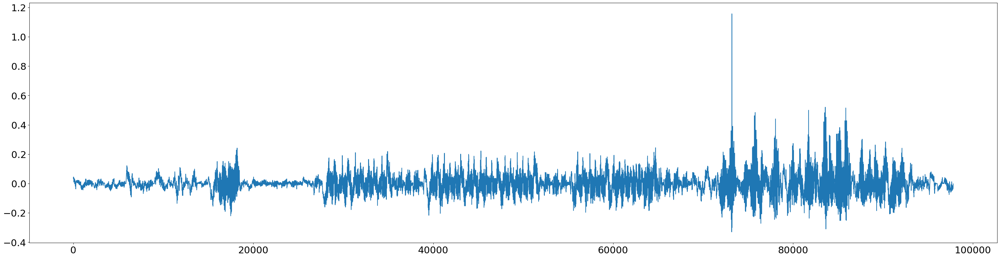

In [71]:
from scipy import signal

corrxy = signal.correlate((x-x.mean()), (full_lap_butterfly_x-full_lap_butterfly_x.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(x)*np.std(full_lap_butterfly_x)*len(full_lap_butterfly_x))
lags = signal.correlation_lags(len(x), len(full_lap_butterfly_x), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 20192


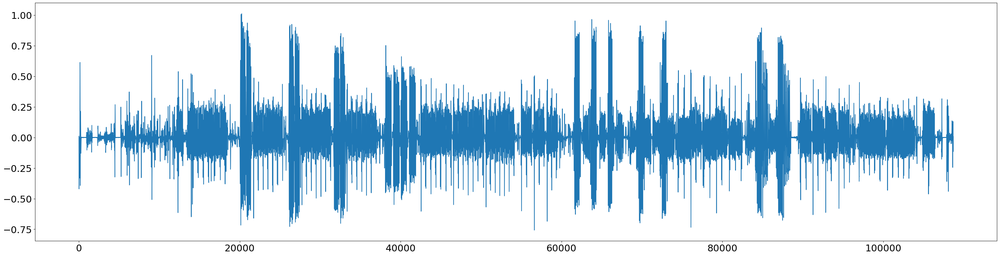

In [58]:
from scipy import signal

corrxy = signal.correlate((x-x.mean()), (butterfly_x-butterfly_x.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(x)*np.std(butterfly_x)*len(butterfly_x))
lags = signal.correlation_lags(len(x), len(butterfly_x), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 87116


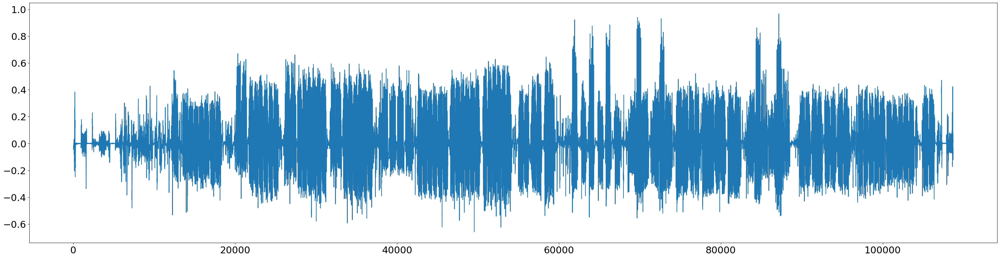

In [51]:

corrxy = signal.correlate((y-y.mean()), (butterfly_y-butterfly_y.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(y)*np.std(butterfly_y)*len(butterfly_y))
lags = signal.correlation_lags(len(y), len(butterfly_y), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

lagxy: 72755


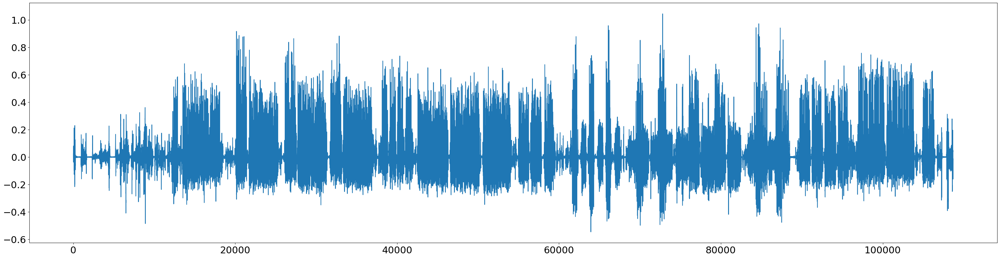

In [53]:
corrxy = signal.correlate((z-z.mean()), (butterfly_z-butterfly_z.mean()), mode="same", method="direct")
corrxy = corrxy /(np.std(z)*np.std(butterfly_z)*len(butterfly_z))
lags = signal.correlation_lags(len(z), len(butterfly_z), mode="same")
lagxy = lags[np.argmax(corrxy)]
print(f'lagxy: {lagxy}')
fig = plt.figure(figsize=(40, 10))
plt.plot(corrxy)

2024-02-07 05:53:13


Text(0, 0.5, 'acceleration in y')

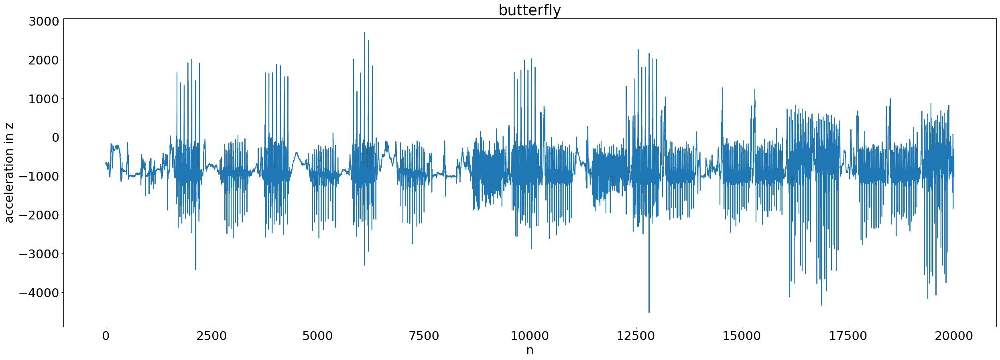

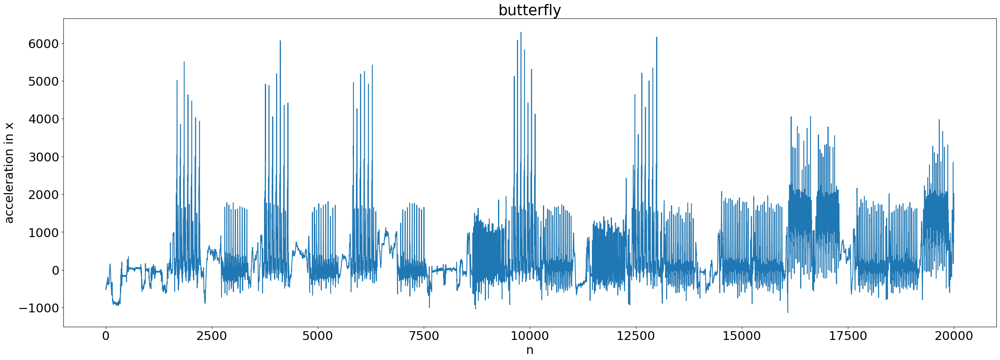

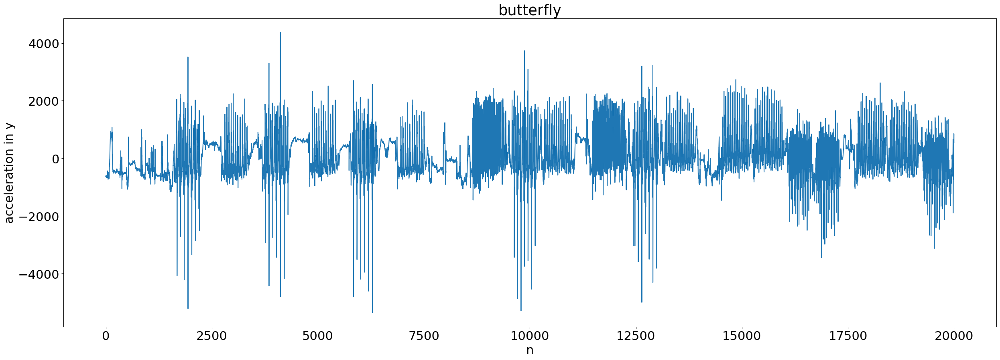

In [54]:
plt.rcParams.update({'font.size': 22})
fig = plt.figure(figsize=(30, 10))
index = 4
date_object = datetime.fromtimestamp(t_all[all_dates_i[index]]/1000.0)
print(date_object)
z = np.array(acc_z[all_dates_i[4]:all_dates_i[5]])
y = np.array(acc_y[all_dates_i[4]:all_dates_i[5]])
x = np.array(acc_x[all_dates_i[4]:all_dates_i[5]])
butterfly_x = x[20275:20365]
butterfly_z = z[20275:20365]
butterfly_y = y[20275:20365]
plt.plot(z[60000:80000])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[60000:80000])
plt.title("butterfly")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30,10))
plt.title("butterfly")
plt.plot(y[60000:80000])
plt.xlabel("n")
plt.ylabel("acceleration in y")

Text(0, 0.5, 'acceleration in y')

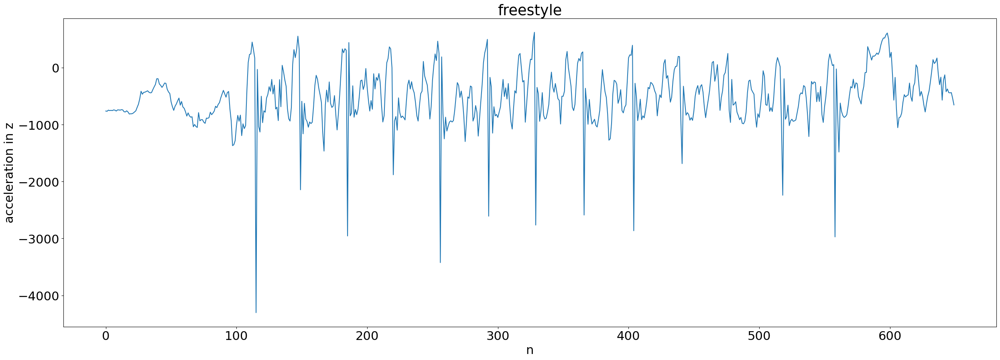

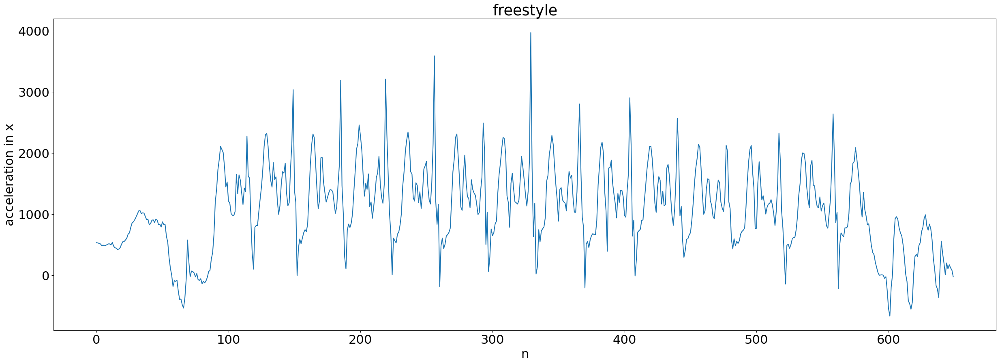

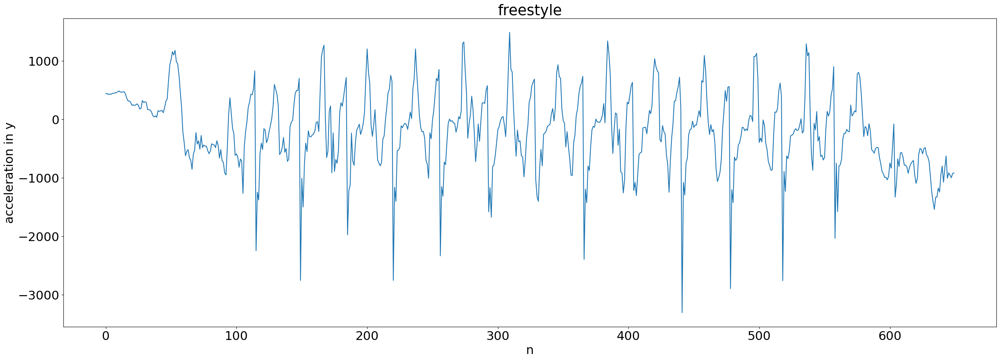

In [19]:
fig = plt.figure(figsize=(30, 10))
z = acc_z[all_dates_i[4]:all_dates_i[5]]
y = acc_y[all_dates_i[4]:all_dates_i[5]]
x = acc_x[all_dates_i[4]:all_dates_i[5]]
plt.plot(z[21650:22300])
plt.title("freestyle")
plt.xlabel("n")
plt.ylabel("acceleration in z")
fig = plt.figure(figsize=(30, 10))
plt.plot(x[21650:22300])
plt.title("freestyle")
plt.xlabel("n")
plt.ylabel("acceleration in x")
fig = plt.figure(figsize=(30, 10))
plt.title("freestyle")
plt.plot(y[21650:22300])
plt.xlabel("n")
plt.ylabel("acceleration in y")

In [ ]:
fig = plt.figure(figsize=(30, 6))
plt.plot(acc_z[all_dates_i[9]:all_dates_i[10]])

In [ ]:
track